<a href="https://colab.research.google.com/github/geo-tp/Keras-Colaboratory-Models/blob/main/visualize_convnets_layers_activiation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# See layers activation and how convnet works on image

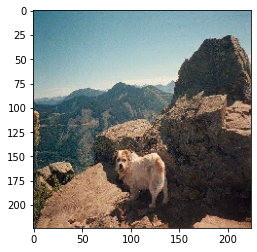

In [9]:
# DATASET & PREPROCESSING

from sys import path
from PIL import Image
from keras import utils
from keras.applications.vgg16 import preprocess_input
import keras
import numpy as np
import matplotlib.pyplot as plt

img_path = keras.utils.get_file(
    "oMdVph0.jpeg", "https://i.imgur.com/oMdVph0.jpeg"
)

# Prepare image
img_size = (224, 224)
img = utils.load_img(img_path, target_size=img_size)
img_tensor = utils.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor = preprocess_input(img_tensor)


plt.imshow(img)

In [10]:
# MODEL DEFINITION - Create an activation model with convnets layers from VGG16

from keras.applications import VGG16
from keras import models

model = VGG16(weights='imagenet',
                  include_top=False,
)

# We want VGG layers of the convnets part
layer_outputs = [layer.output for layer in model.layers[1:]]

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activation_model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                              

In [11]:
# PREDICT

layers_activation = activation_model.predict(img_tensor)

1/1 [==============================] - 1s 1s/step


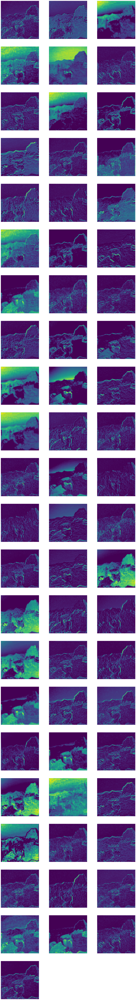

In [12]:
# LOG ACTIVATIONS

layer_index = 2 # Change index to see another layer

activations = layers_activation[layer_index]

fig = plt.figure(figsize=(20, 150))

img_count = activations.shape[3]
rows = 3
columns = img_count // rows + 1

for i in range(img_count):
    sub = fig.add_subplot(columns, rows, i+1)
    sub.axis('off')
    plt.imshow(activations[0, :, :, i])

plt.show()